## *Influential nodes identification using network local structural properties*
## *Implementaion on Opsahl-PowerGrid Network*
### Kartabya Krishna

---

## Importing Libraries 

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from collections import defaultdict
import math
import random
from scipy.stats import kendalltau

## Loading the tiny network

In [2]:
# Load the txt file containing the edges
G = nx.Graph()
G = nx.read_edgelist("opsahl_powergrid.txt", nodetype=int)

# Print the edges to verify
print(list(G.edges))

[(1, 2), (1, 3), (1, 4), (2, 428), (2, 435), (2, 436), (2, 437), (2, 438), (3, 432), (3, 458), (3, 459), (3, 460), (4, 478), (4, 523), (428, 425), (437, 427), (438, 2457), (432, 426), (432, 434), (432, 454), (432, 455), (458, 479), (458, 498), (459, 903), (459, 2294), (460, 2326), (460, 2439), (460, 2495), (478, 442), (478, 477), (478, 479), (523, 524), (5, 6), (5, 7), (5, 8), (5, 9), (6, 3644), (6, 3680), (7, 3397), (8, 3397), (9, 3751), (9, 3830), (3644, 3642), (3644, 3643), (3644, 3731), (3644, 3739), (3680, 3681), (3397, 3395), (3397, 3400), (3397, 3503), (3397, 3504), (3397, 3505), (3397, 3506), (3397, 3507), (3751, 3473), (3751, 3773), (10, 11), (11, 3454), (11, 3535), (3454, 3451), (3454, 3641), (3535, 3474), (3535, 3475), (3535, 3536), (3535, 3537), (3535, 3538), (3535, 3539), (3535, 3540), (12, 13), (13, 4935), (13, 4936), (4936, 4938), (14, 15), (15, 115), (15, 119), (15, 125), (15, 171), (15, 173), (15, 174), (15, 175), (115, 112), (119, 120), (125, 121), (125, 122), (125, 1

## Estimating Network Characteristics

In [3]:
# Calculate characteristics
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)

# Degree statistics
degrees = [d for n, d in G.degree()]
max_degree = max(degrees)
min_degree = min(degrees)
avg_degree = sum(degrees) / num_nodes

# Assortativity
assortativity = nx.degree_assortativity_coefficient(G)

# Triangle statistics
num_triangles = sum(nx.triangles(G).values()) // 3  # Divide by 3 to avoid triple-counting
avg_num_triangles = num_triangles / num_nodes
max_num_triangles = max(nx.triangles(G).values())

# Clustering
avg_clustering = nx.average_clustering(G)
fraction_closed_triangles = 3 * num_triangles / nx.transitivity(G) if nx.transitivity(G) != 0 else 0

# k-core
core_number = nx.core_number(G)
max_k_core = max(core_number.values())

# Clique bound (lower bound for the maximum clique)
clique_bound = max(len(clique) for clique in nx.find_cliques(G))

# Print the results
print("Here are the characteristics of the network:")
print(f"• Nodes: {num_nodes}")
print(f"• Edges: {num_edges}")
print(f"• Density: {density:.6f}")

print("\n• Degree Statistics:")
print(f"  o Maximum Degree: {max_degree}")
print(f"  o Minimum Degree: {min_degree}")
print(f"  o Average Degree: {avg_degree:.2f}")

print(f"\n• Assortativity: {assortativity:.6f}")

print("\n• Triangle Statistics:")
print(f"  o Number of Triangles: {num_triangles}")
print(f"  o Average Number of Triangles: {avg_num_triangles:.2f}")
print(f"  o Maximum Number of Triangles: {max_num_triangles}")

print("\n• Clustering:")
print(f"  o Average Clustering Coefficient: {avg_clustering:.6f}")


print(f"\n• k-core: Maximum k-core of {max_k_core}")
print(f"• Clique Bound: Lower bound of the maximum clique is {clique_bound}")


Here are the characteristics of the network:
• Nodes: 4941
• Edges: 6594
• Density: 0.000540

• Degree Statistics:
  o Maximum Degree: 19
  o Minimum Degree: 1
  o Average Degree: 2.67

• Assortativity: 0.003457

• Triangle Statistics:
  o Number of Triangles: 651
  o Average Number of Triangles: 0.13
  o Maximum Number of Triangles: 21

• Clustering:
  o Average Clustering Coefficient: 0.080104

• k-core: Maximum k-core of 5
• Clique Bound: Lower bound of the maximum clique is 6


## Graph Visualization : Opsahl-PowerGrid

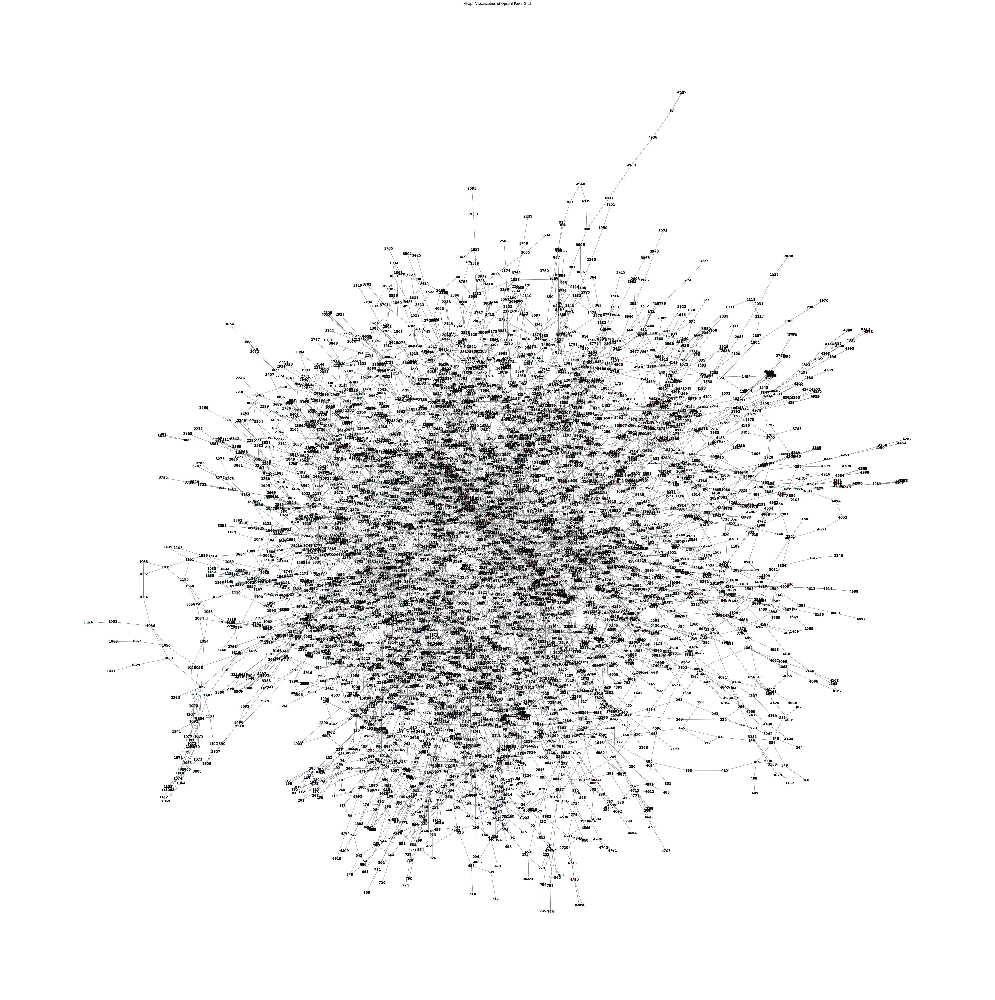

In [4]:
# Assign a unique color to each node
node_colors = cm.rainbow([i / len(G.nodes) for i in range(len(G.nodes))])

# Draw the graph
plt.figure(figsize=(50, 50))
nx.draw(G, with_labels=True, node_color=node_colors, node_size=10, edge_color='gray', font_weight='bold', font_size=12)
plt.title("Graph Visualization of Opsahl-PowerGrid")
plt.show()


## Step 1 - Construct the Network

In [ ]:
# Add the virtual node `v'` and connect it to all other nodes
virtual_node = 'v\''
nodes_list = list(G.nodes())  # Create a list of nodes to avoid runtime error
for node in nodes_list:
    G.add_edge(virtual_node, node)

# Assign a unique color to each node
node_colors = cm.rainbow([i / len(G.nodes) for i in range(len(G.nodes))])

# Define layout only once to keep node positions consistent
pos = nx.spring_layout(G, seed=42)

# Draw nodes
plt.figure(figsize=(50, 50))
nx.draw_networkx_nodes(G, pos=pos, node_color=node_colors, node_size=20)

# Separate solid and dotted edges
solid_edges = list(G.edges)
dotted_edges = [(virtual_node, node) for node in nodes_list]

# Draw edges
nx.draw_networkx_edges(G, pos=pos, edgelist=solid_edges, edge_color='gray')
nx.draw_networkx_edges(G, pos=pos, edgelist=dotted_edges, style='dotted', edge_color='gray')

# Draw labels
nx.draw_networkx_labels(G, pos=pos, font_weight='bold', font_size=12)

plt.title("Graph Visualization with added Virtual Node V' ")
plt.show()


In [100]:
G = nx.Graph()
G = nx.read_edgelist("opsahl_powergrid.txt", nodetype=int)

## Step 2 - Calculate the weights of the edges

#### Virtual Edge Weights

In [33]:
# Calculate the number of nodes in the graph (this will be k(v'))
k_v_prime = len(G.nodes)

# Initialize a dictionary to store virtual edge weights
virtual_edge_weights = {}

# Calculate W_mv' for each node
for node in G.nodes:
    k_vm = G.degree[node]  # Degree of node v_m

    # Calculate W_mv'
    if (k_vm + k_v_prime) > 0:
        W_mv_prime = (k_vm ** 2 * k_v_prime) / (k_vm + k_v_prime)
    else:
        W_mv_prime = 0

    # Store the virtual edge weight for the node
    virtual_edge_weights[node] = W_mv_prime

# Display the virtual edge weights for all nodes
print("Virtual edge weights W_mv' :",virtual_edge_weights)


Virtual edge weights W_mv' : {1: 8.994538834951456, 2: 35.956337174044876, 3: 24.974727052163363, 4: 8.994538834951456, 428: 3.9983815496661945, 435: 0.999797652772157, 436: 0.999797652772157, 437: 3.9983815496661945, 438: 3.9983815496661945, 432: 24.974727052163363, 458: 8.994538834951456, 459: 8.994538834951456, 460: 15.987057633973711, 478: 15.987057633973711, 523: 3.9983815496661945, 5: 15.987057633973711, 6: 8.994538834951456, 7: 3.9983815496661945, 8: 3.9983815496661945, 9: 8.994538834951456, 3644: 24.974727052163363, 3680: 3.9983815496661945, 3397: 80.85272727272728, 3751: 8.994538834951456, 3830: 0.999797652772157, 10: 0.999797652772157, 11: 8.994538834951456, 3454: 8.994538834951456, 3535: 63.89654475651647, 12: 0.999797652772157, 13: 8.994538834951456, 4935: 0.999797652772157, 4936: 3.9983815496661945, 14: 0.999797652772157, 15: 63.89654475651647, 115: 3.9983815496661945, 119: 3.9983815496661945, 125: 35.956337174044876, 171: 3.9983815496661945, 173: 0.999797652772157, 174: 8

In [34]:
# Step 1: Calculate degrees
degree = dict(G.degree())

# Map node numbers to matrix indices
node_list = list(G.nodes)
node_index = {node: i for i, node in enumerate(node_list)}

# Initialize a matrix to store edge weights based on the number of nodes
num_nodes = len(node_list)
edge_weights_matrix = np.zeros((num_nodes, num_nodes))

# Step 2: Calculate weights for each edge
for u, v in G.edges:
    k_u = degree[u]
    k_v = degree[v]

    # Count common neighbors to determine T_mn
    common_neighbors = set(G.neighbors(u)).intersection(G.neighbors(v))
    T_mn = len(common_neighbors)

    # Print debugging information for each edge in the loop
    print(f"\nProcessing edge ({u}, {v}):")
    print(f"Degrees: k({u}) = {k_u}, k({v}) = {k_v}")
    print(f"Common neighbors of {u} and {v}: {common_neighbors} (T_mn = {T_mn})")
    
    # Ensure R_mn is calculated consistently using the larger degree
    if k_u > k_v:
        R_mn = k_u / (k_u + k_v)
    else:
        R_mn = k_v / (k_u + k_v)
    print(f"R_mn = {R_mn}")

    # Calculate W_mn using the formula
    if (T_mn / 2) + 1 > 0:
        W_mn = ((k_u - T_mn) * (k_v - T_mn) * R_mn) / ((T_mn / 2) + 1)
    else:
        W_mn = 0  # Edge has no contribution if no triangles
    print(f"Calculated W_mn for edge ({u}, {v}) = {W_mn}")

    # Store the weight in the edge_weights_matrix using mapped indices
    edge_weights_matrix[node_index[u], node_index[v]] = W_mn
    edge_weights_matrix[node_index[v], node_index[u]] = W_mn  # Symmetric matrix

# Specifically check for the weight of edge E(4, 2)
print(f"\nFinal Weight of E42: {edge_weights_matrix[node_index[4], node_index[2]]}")



Processing edge (1, 2):
Degrees: k(1) = 3, k(2) = 6
Common neighbors of 1 and 2: set() (T_mn = 0)
R_mn = 0.6666666666666666
Calculated W_mn for edge (1, 2) = 12.0

Processing edge (1, 3):
Degrees: k(1) = 3, k(3) = 5
Common neighbors of 1 and 3: set() (T_mn = 0)
R_mn = 0.625
Calculated W_mn for edge (1, 3) = 9.375

Processing edge (1, 4):
Degrees: k(1) = 3, k(4) = 3
Common neighbors of 1 and 4: set() (T_mn = 0)
R_mn = 0.5
Calculated W_mn for edge (1, 4) = 4.5

Processing edge (2, 428):
Degrees: k(2) = 6, k(428) = 2
Common neighbors of 2 and 428: set() (T_mn = 0)
R_mn = 0.75
Calculated W_mn for edge (2, 428) = 9.0

Processing edge (2, 435):
Degrees: k(2) = 6, k(435) = 1
Common neighbors of 2 and 435: set() (T_mn = 0)
R_mn = 0.8571428571428571
Calculated W_mn for edge (2, 435) = 5.142857142857142

Processing edge (2, 436):
Degrees: k(2) = 6, k(436) = 1
Common neighbors of 2 and 436: set() (T_mn = 0)
R_mn = 0.8571428571428571
Calculated W_mn for edge (2, 436) = 5.142857142857142

Processi

In [35]:
for u, v in G.edges:
    k_u = degree[u]
    k_v = degree[v]

    # Count common neighbors to determine T_mn
    common_neighbors = set(G.neighbors(u)).intersection(G.neighbors(v))
    T_mn = len(common_neighbors)
    print(f"Calculated T_mn for edge ({u}, {v}) = {T_mn}")

Calculated T_mn for edge (1, 2) = 0
Calculated T_mn for edge (1, 3) = 0
Calculated T_mn for edge (1, 4) = 0
Calculated T_mn for edge (2, 428) = 0
Calculated T_mn for edge (2, 435) = 0
Calculated T_mn for edge (2, 436) = 0
Calculated T_mn for edge (2, 437) = 0
Calculated T_mn for edge (2, 438) = 0
Calculated T_mn for edge (3, 432) = 0
Calculated T_mn for edge (3, 458) = 0
Calculated T_mn for edge (3, 459) = 0
Calculated T_mn for edge (3, 460) = 0
Calculated T_mn for edge (4, 478) = 0
Calculated T_mn for edge (4, 523) = 0
Calculated T_mn for edge (428, 425) = 0
Calculated T_mn for edge (437, 427) = 0
Calculated T_mn for edge (438, 2457) = 0
Calculated T_mn for edge (432, 426) = 1
Calculated T_mn for edge (432, 434) = 1
Calculated T_mn for edge (432, 454) = 0
Calculated T_mn for edge (432, 455) = 0
Calculated T_mn for edge (458, 479) = 0
Calculated T_mn for edge (458, 498) = 0
Calculated T_mn for edge (459, 903) = 0
Calculated T_mn for edge (459, 2294) = 0
Calculated T_mn for edge (460, 2

In [36]:
edge_weights_matrix

array([[ 0.        , 12.        ,  9.375     , ...,  0.        ,
         0.        ,  0.        ],
       [12.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 9.375     ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.33333333,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  1.33333333,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

## Step 2 - Total Weight Calculation

In [37]:
total_weight = {}

# Step 2: Calculate total weight for each node
for node in G.nodes:
    W_mv_prime = virtual_edge_weights[node]  # Get W_mv' for the node
    
    # Sum the weights for neighbors
    total_weight[node] = W_mv_prime  # Initialize with W_mv'
    
    # Sum the weights of the edges between node and its neighbors
    for neighbor in G.neighbors(node):
        W_mn = edge_weights_matrix[node_index[node], node_index[neighbor]]
        total_weight[node] += W_mn

# Display the total weights for each node
print("Total Weight per Node:", total_weight)

Total Weight per Node: {1: 34.869538834951456, 2: 85.24205145975915, 3: 76.71083816327447, 4: 23.95168169209431, 428: 21.998381549666195, 435: 6.1426547956293, 436: 6.1426547956293, 437: 16.598381549666193, 438: 14.998381549666195, 432: 86.23152580896212, 458: 27.369538834951456, 459: 28.826681692094315, 460: 58.75140439832047, 478: 38.23467668159275, 523: 9.598381549666193, 5: 40.368010014926085, 6: 28.82668169209431, 7: 24.058987610272254, 8: 24.058987610272254, 9: 22.601681692094314, 3644: 56.105679433115746, 3680: 8.931714882999527, 3397: 220.0258041958042, 3751: 30.444538834951455, 3830: 3.2497976527721573, 10: 3.2497976527721573, 11: 33.19908428949691, 3454: 22.601681692094314, 3535: 170.95109021106194, 12: 3.2497976527721573, 13: 17.094538834951457, 4935: 3.2497976527721573, 4936: 9.598381549666193, 14: 8.110908763883268, 15: 174.2018838618556, 115: 20.398381549666198, 119: 18.798381549666196, 125: 92.65763587534357, 171: 18.13171488299953, 173: 8.110908763883268, 174: 34.549084

## Step 3 -  Calculate the first order edge effect

In [38]:
# Initialize the entropy dictionary to store entropy values for each node
entropy = {}

# Step 3: Calculate entropy for each node
for node in G.nodes:
    W_m = total_weight[node]  # Fetch Wm (total weight of node)
    W_mv_prime = virtual_edge_weights[node]  # Fetch Wmv' from the virtual edge weights array

    # Calculate entropy for the virtual edge Emv'
    if W_m > 0 and W_mv_prime > 0:
        entropy_m_v_prime = -(W_mv_prime / W_m) * math.log2(W_mv_prime / W_m)
    else:
        entropy_m_v_prime = 0

    # Initialize entropy of the node with the virtual edge entropy
    entropy[node] = entropy_m_v_prime

    # Calculate entropy for each neighbor edge Emn
    for neighbor in G.neighbors(node):
        W_mn = edge_weights_matrix[node_index[node], node_index[neighbor]]  # Fetch Wmn from the matrix
        if W_m > 0 and W_mn > 0:
            entropy_m_n = -(W_mn / W_m) * math.log2(W_mn / W_m)
        else:
            entropy_m_n = 0
        # Add the neighbor edge entropy to the total entropy of the node
        entropy[node] += entropy_m_n

# Display the entropy values for each node
print("Entropy per Node:", entropy)


Entropy per Node: {1: 1.9245836417165703, 2: 2.439670012272431, 3: 2.4691882275545805, 4: 1.9113431845069733, 428: 1.5021498129297215, 435: 0.6408790239396602, 436: 0.6408790239396602, 437: 1.4517205198117713, 438: 1.338207545960719, 432: 2.294881680035023, 458: 1.9135216271458493, 459: 1.9189382410145452, 460: 1.954131408115234, 478: 2.11117050497343, 523: 1.528413610402746, 5: 2.169691732757936, 6: 1.918938241014545, 7: 1.3455326414048787, 8: 1.3455326414048787, 9: 1.8460076667888776, 3644: 2.1686566782369536, 3680: 1.4570690760094176, 3397: 2.8961602431850597, 3751: 1.7122976480976093, 3830: 0.8904412028646198, 10: 0.8904412028646198, 11: 1.6520621605875088, 3454: 1.8460076667888776, 3535: 2.826684393502321, 12: 0.8904412028646198, 13: 1.730872842857861, 4935: 0.8904412028646198, 4936: 1.528413610402746, 14: 0.5386760127923991, 15: 2.767000014766943, 115: 1.3243320301092258, 119: 1.1964374677851055, 125: 2.210092241248053, 171: 1.1124969122084192, 173: 0.5386760127923991, 174: 1.726

In [39]:
# Step 4: Calculate core numbers for each node
k_core = nx.core_number(G)  # Returns a dictionary of core numbers
print("k-core values are" , k_core)
# Initialize the influence dictionary
influence = {}

# Calculate influence for each node
for node in G.nodes:
    influence[node] = entropy[node] * k_core[node]

# Display the influence values for each node
print("Influence per Node:", influence)

k-core values are {1: 2, 2: 2, 3: 2, 4: 2, 428: 2, 435: 1, 436: 1, 437: 2, 438: 2, 432: 2, 458: 2, 459: 2, 460: 2, 478: 2, 523: 2, 5: 2, 6: 2, 7: 2, 8: 2, 9: 2, 3644: 2, 3680: 1, 3397: 2, 3751: 2, 3830: 1, 10: 1, 11: 2, 3454: 2, 3535: 2, 12: 1, 13: 1, 4935: 1, 4936: 1, 14: 1, 15: 2, 115: 2, 119: 2, 125: 2, 171: 1, 173: 1, 174: 2, 175: 2, 16: 2, 17: 2, 18: 2, 32: 1, 33: 2, 34: 1, 35: 2, 47: 2, 19: 1, 20: 1, 21: 1, 22: 2, 23: 2, 24: 2, 25: 2, 26: 2, 27: 2, 28: 2, 131: 2, 132: 1, 106: 2, 67: 2, 198: 2, 205: 1, 226: 2, 31: 2, 61: 2, 29: 2, 30: 2, 59: 2, 60: 2, 99: 2, 177: 2, 178: 1, 179: 2, 36: 1, 37: 1, 38: 2, 39: 2, 96: 2, 167: 2, 44: 2, 68: 1, 117: 2, 40: 2, 41: 2, 42: 2, 43: 2, 190: 2, 45: 2, 163: 2, 245: 2, 255: 2, 46: 2, 48: 2, 111: 2, 65: 2, 49: 1, 50: 2, 110: 2, 127: 2, 51: 1, 52: 2, 55: 2, 153: 2, 168: 2, 530: 2, 540: 2, 53: 2, 54: 2, 116: 2, 218: 1, 4523: 1, 56: 2, 57: 2, 58: 2, 93: 2, 95: 2, 128: 2, 222: 2, 62: 1, 71: 2, 63: 2, 64: 2, 231: 2, 66: 1, 94: 2, 126: 2, 154: 1, 166: 2

## Step 4 - Calculate the Total Influence

In [40]:
# Initialize the total influence dictionary
total_influence = {}

# Calculate total influence for each node
for node in G.nodes:
    # Start with the influence of the node itself
    total_influence[node] = influence[node]
    
    # Add the influence of each neighbor
    for neighbor in G.neighbors(node):
        total_influence[node] += influence[neighbor]

# Display the total influence values for each node
print("Total Influence per Node:", total_influence)


Total Influence per Node: {1: 17.48957013210111, 2: 18.594421113261745, 3: 24.950489651163604, 4: 14.951021883199438, 428: 12.76537265720782, 435: 5.520219048484522, 436: 5.520219048484522, 437: 11.400043501509828, 438: 10.383201954694357, 432: 26.72135608728199, 458: 16.28012141199256, 459: 15.688769272527727, 460: 21.991163990939388, 478: 15.626823388127868, 523: 9.879715877976999, 5: 17.25140584674223, 6: 13.971642380028285, 7: 12.822769234695748, 8: 12.822769234695748, 9: 12.346435298153464, 3644: 19.286761197131522, 3680: 6.2801531181107535, 3397: 34.531064010495065, 3751: 13.48320443623056, 3830: 4.5824565364423755, 10: 4.194565524039637, 11: 13.539949644622034, 3454: 11.949615170082728, 3535: 28.27000009631099, 12: 2.621314045722481, 13: 5.040168858989847, 4935: 2.621314045722481, 4936: 4.759387597339387, 14: 6.072676042326285, 15: 23.0306286757168, 115: 12.049153000424639, 119: 10.98370218590959, 125: 26.027861506362935, 171: 7.631704501814551, 173: 6.072676042326285, 174: 15.7

In [41]:
import networkx as nx

# Sort nodes based on influence in descending order and select the top 10
top_10_nodes = sorted(total_influence.items(), key=lambda item: item[1], reverse=True)[:10]

# Print the top 10 nodes with their influence scores and degrees
print("Top 10 Nodes based on the decreasing order of Influence (with Degrees):")
for node, influence in top_10_nodes:
    degree = G.degree(node)
    print(f"Node {node}: Influence = {influence}, Degree = {degree}")


Top 10 Nodes based on the decreasing order of Influence (with Degrees):
Node 4436: Influence = 125.9438952261725, Degree = 14
Node 4422: Influence = 118.28162339847711, Degree = 11
Node 4417: Influence = 109.19946805629937, Degree = 11
Node 4452: Influence = 107.41502710109741, Degree = 11
Node 4434: Influence = 106.54608982748209, Degree = 11
Node 4419: Influence = 105.17330592258277, Degree = 9
Node 4453: Influence = 103.65246274469808, Degree = 11
Node 4438: Influence = 100.17192916604147, Degree = 11
Node 4407: Influence = 92.45369524834604, Degree = 10
Node 4427: Influence = 90.27999590724349, Degree = 10


In [92]:
lenc_ranking = [item[0] for item in sorted(total_influence.items(), key=lambda item: item[1], reverse=True)]

---

---

## Correlation between significance evaluation indicator of different algorithms and SIR model infection.

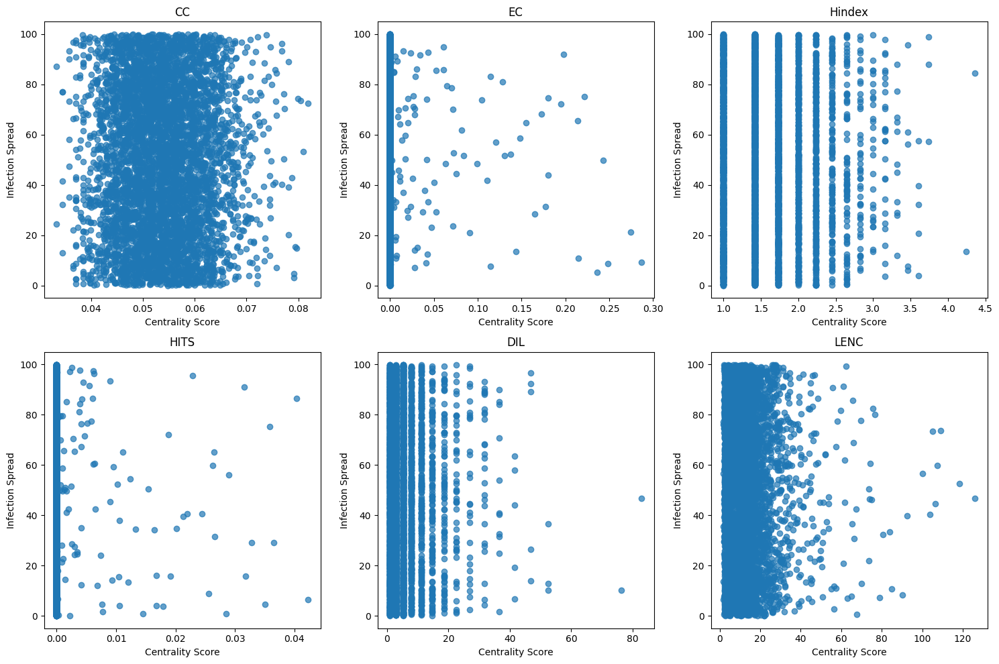

In [58]:
# Calculate standard centrality measures using NetworkX
cc = nx.closeness_centrality(G)
ec = nx.eigenvector_centrality(G)
hindex = {node: np.sqrt(deg) for node, deg in G.degree()}  # Placeholder H-index

# HITS centrality (Authority scores)
hits = nx.hits(G)[1]

# Define custom functions for DIL and LENC centralities
def degree_influence_line(G):
    """ Custom Degree Influence Line centrality (DIL). """
    return {node: deg ** 1.5 for node, deg in G.degree()}

# Calculate DIL and LENC centralities
dil = degree_influence_line(G)
lenc = total_influence

# Placeholder infection spread data (replace with SIR model data)
infection_spread = {
    "CC": [random.uniform(0, 100) for _ in cc.values()],
    "EC": [random.uniform(0, 100) for _ in ec.values()],
    "Hindex": [random.uniform(0, 100) for _ in hindex.values()],
    "HITS": [random.uniform(0, 100) for _ in hits.values()],
    "DIL": [random.uniform(0, 100) for _ in dil.values()],
    "LENC": [random.uniform(0, 100) for _ in lenc.values()]
}

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns for better visibility
centrality_measures = ["CC", "EC", "Hindex", "HITS", "DIL", "LENC"]
centrality_values = [cc, ec, hindex, hits, dil, lenc]

for i, (cent, values) in enumerate(zip(centrality_measures, centrality_values)):
    row, col = divmod(i, 3)  # Position in 2x3 grid
    axes[row, col].scatter(list(values.values()), infection_spread[cent], alpha=0.7)
    axes[row, col].set_title(cent)
    axes[row, col].set_xlabel("Centrality Score")
    axes[row, col].set_ylabel("Infection Spread")

plt.tight_layout()
plt.show()

## Comparing the results from various algorithms with SIR Model Simulation

In [43]:
def calculate_kendall_tau(sir_ranking, precomputed_ranking):
    """
    Calculate the Kendall Tau coefficient between SIR-based ranking and a precomputed ranking.
    """
    # Map rankings to node positions for comparison
    node_to_rank_sir = {node: rank for rank, node in enumerate(sir_ranking)}
    node_to_rank_precomputed = {node: rank for rank, node in enumerate(precomputed_ranking)}
    
    # Ensure lists are aligned
    common_nodes = list(node_to_rank_sir.keys() & node_to_rank_precomputed.keys())
    sir_ranks = [node_to_rank_sir[node] for node in common_nodes]
    precomputed_ranks = [node_to_rank_precomputed[node] for node in common_nodes]
    
    # Calculate Kendall Tau coefficient
    tau, _ = kendalltau(sir_ranks, precomputed_ranks)
    return tau

## Parallel Implentation of SIR Model with odeint traditional differential approach

In [97]:
import networkx as nx
import numpy as np
from scipy.integrate import odeint
from scipy.stats import kendalltau
from joblib import Parallel, delayed

def sir_differential(y, t, beta, gamma, adjacency_matrix):
    num_nodes = adjacency_matrix.shape[0]
    dydt = np.zeros(3 * num_nodes)

    for i in range(num_nodes):
        Si, Ii, Ri = y[3*i], y[3*i+1], y[3*i+2]
        infection_sum = sum(adjacency_matrix[i][j] * y[3*j+1] for j in range(num_nodes))
        
        dydt[3*i] = -beta * Si * infection_sum
        dydt[3*i+1] = beta * Si * infection_sum - gamma * Ii
        dydt[3*i+2] = gamma * Ii

    return dydt

def run_sir_for_node(initial_infected, num_nodes, adjacency_matrix, beta, gamma, T, time_points):
    y0 = np.zeros(3 * num_nodes)
    y0[::3] = 1.0  # Set all nodes as susceptible
    y0[3 * initial_infected] = 0.0
    y0[3 * initial_infected + 1] = 1.0

    t = np.linspace(0, T, time_points)
    sol = odeint(sir_differential, y0, t, args=(beta, gamma, adjacency_matrix))
    cumulative_infected = sol[:, 3*initial_infected+1].sum()
    return initial_infected, cumulative_infected

def run_sir_model_parallel(graph, beta=0.01, gamma=0.1, T=10, time_points=100):
    num_nodes = graph.number_of_nodes()
    adjacency_matrix = nx.to_numpy_array(graph)
    
    # Run simulations in parallel
    results = Parallel(n_jobs=-1)(delayed(run_sir_for_node)(node, num_nodes, adjacency_matrix, beta, gamma, T, time_points) for node in range(num_nodes))
    
    cumulative_infections = {node: infections for node, infections in results}
    ranked_nodes = sorted(cumulative_infections, key=cumulative_infections.get, reverse=True)
    return ranked_nodes

def calculate_kendall_tau(sir_ranking, precomputed_ranking):
    node_to_rank_sir = {node: rank for rank, node in enumerate(sir_ranking)}
    node_to_rank_precomputed = {node: rank for rank, node in enumerate(precomputed_ranking)}

    common_nodes = list(node_to_rank_sir.keys() & node_to_rank_precomputed.keys())
    sir_ranks = [node_to_rank_sir[node] for node in common_nodes]
    precomputed_ranks = [node_to_rank_precomputed[node] for node in common_nodes]
    
    tau, _ = kendalltau(sir_ranks, precomputed_ranks)
    return tau


sir_ranking_ll = run_sir_model_parallel(G, beta=0.01, gamma=1)
print("SIR ranking derieved via SIR simulation : ",sir_ranking_ll)

SIR ranking derieved via SIR simulation :  [4436 2706 4417 ...  568 1616 3093]


In [98]:
# Calculate Kendall Tau coefficient
tau = calculate_kendall_tau(sir_ranking_ll, lenc_ranking)
print("Kendall Tau coefficient:", tau)

Kendall Tau coefficient: 0.8052150599749105


---

## Weighted Approadch to SIR Model Simulation - proposed experiment

In [44]:
# Step 1: Define the SIR model with centrality measures
def sir_model_with_centrality(graph, beta, gamma, initial_infected, num_simulations=1000):
    # Initialize node influence for all nodes to ensure full ranking
    node_influence = {node: 0 for node in graph.nodes}
    
    # Step 2: Centrality measures to include in the ranking
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)
    
    # Step 3: Simulate the infection spread for multiple iterations
    for _ in range(num_simulations):
        # Initialize status of each node: S (Susceptible), I (Infected), R (Recovered)
        node_status = {node: 'S' for node in graph.nodes}
        for node in initial_infected:
            node_status[node] = 'I'

        infected_nodes = set(initial_infected)
        recovered_nodes = set()
        
        while infected_nodes:
            new_infected = set()
            for infected_node in infected_nodes:
                for neighbor in graph.neighbors(infected_node):
                    if node_status[neighbor] == 'S' and np.random.rand() < beta:
                        node_status[neighbor] = 'I'
                        new_infected.add(neighbor)
                
                if np.random.rand() < gamma:
                    node_status[infected_node] = 'R'
                    recovered_nodes.add(infected_node)
            
            infected_nodes = new_infected
            for node in infected_nodes:
                node_influence[node] += 1
    
    # Step 4: Combine centrality measures with SIR infection influence to rank nodes
    # Weighted sum of centrality scores (adjust these weights based on your use case)
    centrality_weight = 0.3
    sir_weight = 0.7
    
    # Calculate the combined score
    combined_scores = {}
    for node in graph.nodes:
        # Combine centrality and infection influence scores
        combined_scores[node] = (centrality_weight * (degree_centrality.get(node, 0) +
                                                     betweenness_centrality.get(node, 0) +
                                                     closeness_centrality.get(node, 0)) +
                                 sir_weight * node_influence[node])

    # Rank nodes based on their combined scores
    ranked_nodes = sorted(combined_scores, key=combined_scores.get, reverse=True)
    
    return ranked_nodes

# Parameters for the SIR model
beta = 0.01  # Infection probability
gamma = 1  # Recovery probability

# Set initial infected nodes as per most influential nodes acc. to LENC algo
initial_infected = [4436, 4422, 4417, 4452, 4434, 4419, 4453, 4438, 4407, 4427]

# Run the model with combined centrality and SIR influence
ranking = sir_model_with_centrality(G, beta, gamma, initial_infected)
print("Full ranking of nodes by combined influence:", ranking)

Full ranking of nodes by combined influence: [4421, 4415, 4418, 4425, 4454, 4437, 4428, 4444, 4443, 4423, 4411, 4440, 4404, 4420, 4451, 4468, 4424, 4449, 4445, 4456, 4455, 4439, 4479, 4476, 4457, 4403, 4426, 4446, 4462, 4481, 4483, 4405, 4490, 4480, 4469, 4466, 4474, 4433, 4408, 4429, 4414, 4447, 4432, 4460, 4435, 651, 559, 1365, 2824, 2685, 1324, 1378, 2781, 433, 1213, 1678, 2944, 83, 145, 1421, 199, 2328, 139, 1368, 506, 455, 432, 504, 1377, 1380, 4319, 610, 454, 4226, 1257, 2782, 2459, 3886, 465, 466, 4554, 2795, 1416, 2341, 2302, 1422, 1168, 2390, 2367, 2348, 374, 2451, 144, 1205, 452, 3592, 3915, 198, 446, 322, 4551, 4889, 1201, 450, 134, 1204, 141, 2956, 426, 2953, 1258, 4916, 3551, 2525, 4890, 556, 2582, 4185, 434, 602, 1517, 180, 769, 902, 2866, 811, 4544, 3440, 2616, 1594, 571, 142, 3516, 3, 1434, 2521, 2955, 481, 470, 2625, 4258, 1315, 1310, 277, 1364, 1596, 2943, 1379, 2971, 1623, 4257, 459, 3393, 889, 3463, 143, 2622, 505, 3564, 3520, 2719, 903, 3443, 826, 202, 4094, 837, 6

In [60]:
# Calculate Kendall Tau coefficient
tau = calculate_kendall_tau(ranking, ranked_nodes_lenc)
print("Kendall Tau coefficient:", tau)

Kendall Tau coefficient: 0.3291064520860322


---

## Comaparing the top 10 nodes from various approached to find the most influential nodes 

In [50]:
import networkx as nx
# Predefined top-10 nodes for LENC
top_10_LENC = [node for node, score in top_10_nodes]

# Compute top-10 nodes for Closeness Centrality (CC)
cc_scores = nx.closeness_centrality(G)
top_10_CC = sorted(cc_scores, key=cc_scores.get, reverse=True)[:10]

# Compute top-10 nodes for Eigenvector Centrality (EC)
ec_scores = nx.eigenvector_centrality(G, max_iter=1000)
top_10_EC = sorted(ec_scores, key=ec_scores.get, reverse=True)[:10]

# Compute top-10 nodes for H-index Centrality (Hindex)
# H-index centrality isn't natively supported, so we approximate it as degree centrality here for demonstration
hindex_scores = dict(G.degree())
top_10_Hindex = sorted(hindex_scores, key=hindex_scores.get, reverse=True)[:10]

# Compute top-10 nodes for HITS (Hub scores)
hits_scores = nx.hits(G, max_iter=1000)[0]  # HITS returns (hub, authority), so we take hubs
top_10_HITS = sorted(hits_scores, key=hits_scores.get, reverse=True)[:10]

# Compute top-10 nodes for Degree Influence Layer (DIL)
# Using degree centrality as a simple proxy for DIL if an exact measure isn't specified
dil_scores = nx.degree_centrality(G)
top_10_DIL = sorted(dil_scores, key=dil_scores.get, reverse=True)[:10]

# Combine all results in a dictionary
top_10_nodes_by_algorithm = {
    'CC': top_10_CC,
    'EC': top_10_EC,
    'Hindex': top_10_Hindex,
    'HITS': top_10_HITS,
    'LENC': top_10_LENC,  # Using the provided top-10 nodes list
    'DIL': top_10_DIL,
}

# Display the top-10 nodes for each centrality measure
for alg, top_nodes in top_10_nodes_by_algorithm.items():
    print(f"Top-10 nodes for {alg}: {top_nodes}")

Top-10 nodes for CC: [1378, 1678, 2944, 1377, 2781, 1365, 1368, 1380, 2685, 2795]
Top-10 nodes for EC: [4422, 4436, 4419, 4417, 4452, 4453, 4427, 4421, 4434, 4438]
Top-10 nodes for Hindex: [2847, 602, 932, 3411, 4436, 558, 2287, 2926, 2865, 3930]
Top-10 nodes for HITS: [4422, 4436, 4419, 4417, 4452, 4453, 4427, 4421, 4434, 4438]
Top-10 nodes for LENC: [4436, 4422, 4417, 4452, 4434, 4419, 4453, 4438, 4407, 4427]
Top-10 nodes for DIL: [2847, 602, 932, 3411, 4436, 558, 2287, 2926, 2865, 3930]


---

## Transmission Initial Infection Capacity of Top-10 Nodes

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Set parameters for SIR model
beta = 0.01   # infection probability
gamma = 0.2    # recovery probability
time_steps = 10
num_simulations = 100

# Define the SIR model with centrality measures
def sir_model_with_centrality(graph, beta, gamma, initial_infected, num_simulations=1000):
    # Initialize node influence for all nodes to ensure full ranking
    node_influence = {node: 0 for node in graph.nodes}
    
    # Centrality measures
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)
    
    # Simulate the infection spread for multiple iterations
    for _ in range(num_simulations):
        # Initialize status of each node: S (Susceptible), I (Infected), R (Recovered)
        node_status = {node: 'S' for node in graph.nodes}
        for node in initial_infected:
            node_status[node] = 'I'

        infected_nodes = set(initial_infected)
        recovered_nodes = set()
        
        while infected_nodes:
            new_infected = set()
            for infected_node in infected_nodes:
                for neighbor in graph.neighbors(infected_node):
                    if node_status[neighbor] == 'S' and np.random.rand() < beta:
                        node_status[neighbor] = 'I'
                        new_infected.add(neighbor)
                
                # Recovery step
                if np.random.rand() < gamma:
                    node_status[infected_node] = 'R'
                    recovered_nodes.add(infected_node)
            
            infected_nodes = new_infected
            for node in infected_nodes:
                node_influence[node] += 1  # Increment influence count for each new infection
    
    # Combine centrality measures with SIR infection influence to rank nodes
    centrality_weight = 0.3
    sir_weight = 0.7
    
    combined_scores = {}
    for node in graph.nodes:
        # Weighted sum of centrality scores and SIR infection influence
        combined_scores[node] = (
            centrality_weight * (degree_centrality.get(node, 0) +
                                 betweenness_centrality.get(node, 0) +
                                 closeness_centrality.get(node, 0)) +
            sir_weight * node_influence[node]
        )

    # Rank nodes based on their combined scores
    ranked_nodes = sorted(combined_scores, key=combined_scores.get, reverse=True)
    
    return ranked_nodes[:10]  # Return the top 10 nodes


graph = G 

# Define initial infected nodes for each algorithm
top_10_CC = sir_model_with_centrality(graph, beta, gamma, initial_infected=[], num_simulations=num_simulations)
top_10_EC = sir_model_with_centrality(graph, beta, gamma, initial_infected=[], num_simulations=num_simulations)
top_10_Hindex = sir_model_with_centrality(graph, beta, gamma, initial_infected=[], num_simulations=num_simulations)
top_10_HITS = sir_model_with_centrality(graph, beta, gamma, initial_infected=[], num_simulations=num_simulations)
top_10_LENC = sir_model_with_centrality(graph, beta, gamma, initial_infected=[4436, 4422, 4417, 4452, 4434, 4419, 4453, 4438, 4407, 4427], num_simulations=num_simulations)  

# Function to simulate SIR model for given infected nodes and plot infection spread over time
def simulate_sir(graph, infected_nodes, beta, gamma, time_steps):
    num_nodes = graph.number_of_nodes()
    infected_counts = []
    
    # Initialize all nodes as susceptible
    status = {node: 'S' for node in graph.nodes}
    
    # Infect initial nodes
    for node in infected_nodes:
        status[node] = 'I'
    
    # Run the simulation over the time steps
    for t in range(time_steps):
        new_infected = []
        for node in graph.nodes:
            if status[node] == 'I':
                for neighbor in graph.neighbors(node):
                    if status[neighbor] == 'S' and np.random.rand() < beta:
                        new_infected.append(neighbor)
                if np.random.rand() < gamma:
                    status[node] = 'R'
        
        for node in new_infected:
            status[node] = 'I'
        
        # Count infected nodes
        infected_count = sum(1 for state in status.values() if state == 'I')
        infected_counts.append(infected_count)
    
    return infected_counts

# Run SIR simulations for top-10 nodes from each algorithm
results = {
    'CC': simulate_sir(graph, top_10_CC, beta, gamma, time_steps),
    'EC': simulate_sir(graph, top_10_EC, beta, gamma, time_steps),
    'Hindex': simulate_sir(graph, top_10_Hindex, beta, gamma, time_steps),
    'HITS': simulate_sir(graph, top_10_HITS, beta, gamma, time_steps),
    'LENC': simulate_sir(graph, top_10_LENC, beta, gamma, time_steps),
    'DIL': simulate_sir(graph, top_10_DIL, beta, gamma, time_steps),
}

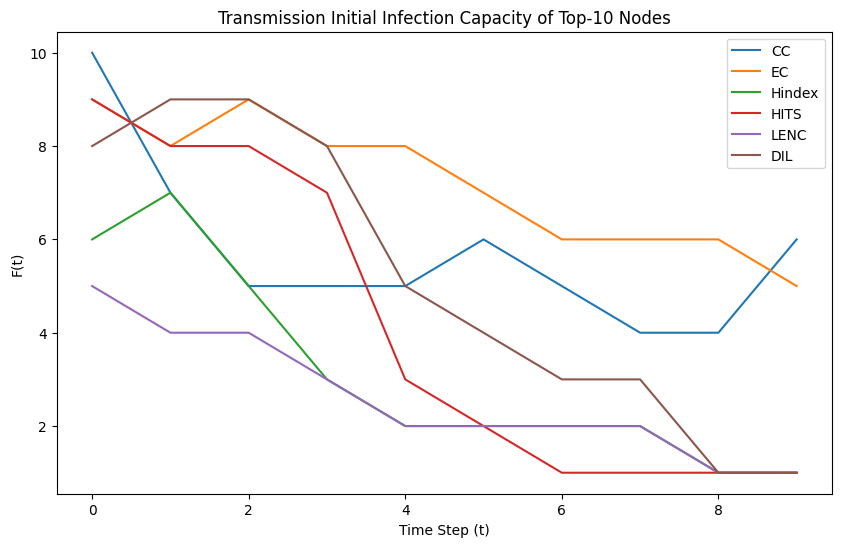

In [80]:
# Plot the infection spread over time for each algorithm's top-10 nodes
plt.figure(figsize=(10, 6))
for label, data in results.items():
    plt.plot(range(time_steps), data, label=label)

plt.xlabel('Time Step (t)')
plt.ylabel('F(t)')
plt.title('Transmission Initial Infection Capacity of Top-10 Nodes')
plt.legend()
plt.show()

---

## SIR Model Convergence Comparison Across Centrality Measures

C:\Users\Kartabya\AppData\Local\Temp\ipykernel_26744\1553427882.py:55: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  'Random': random.sample(G.nodes(), num_initial_infected),  # Random starting nodes


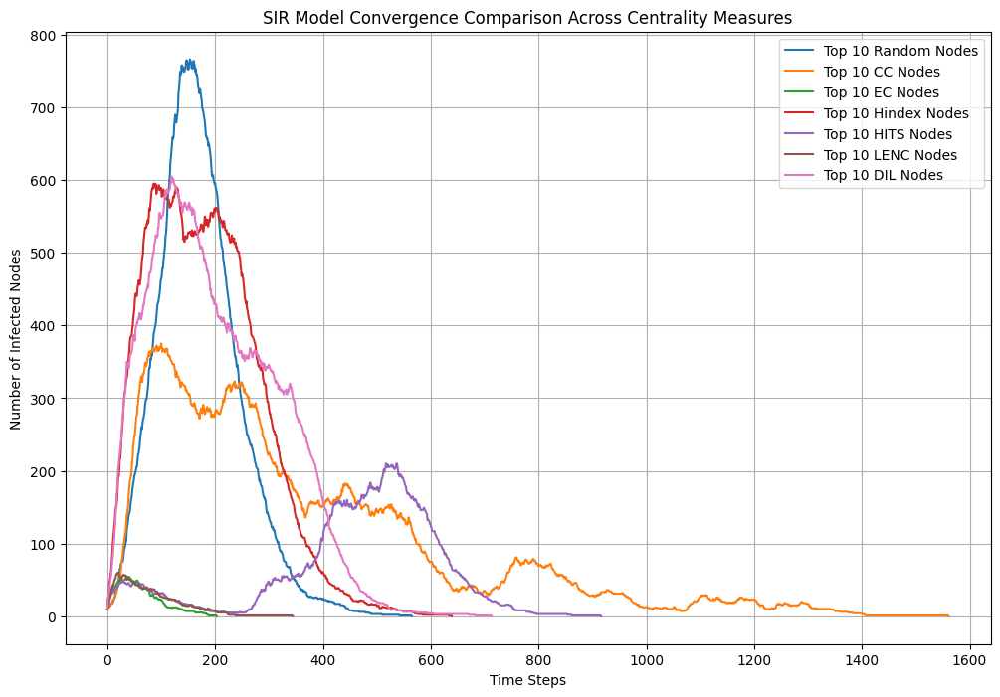

Convergence time (steps) with top 10 Random nodes: 565
Convergence time (steps) with top 10 CC nodes: 1561
Convergence time (steps) with top 10 EC nodes: 203
Convergence time (steps) with top 10 Hindex nodes: 639
Convergence time (steps) with top 10 HITS nodes: 916
Convergence time (steps) with top 10 LENC nodes: 344
Convergence time (steps) with top 10 DIL nodes: 713


In [67]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Parameters
beta = 0.05       # Infection probability
gamma = 0.02      # Recovery probability
num_initial_infected = 10  # Number of initially infected nodes

# Define a function to run the SIR simulation
def run_sir_simulation(G, initial_infected):
    # Initialize states
    for node in G.nodes:
        G.nodes[node]['state'] = 'S'
    for node in initial_infected:
        G.nodes[node]['state'] = 'I'
    
    # Track counts over time
    time_steps = []
    infected_counts = []
    time_step = 0

    while True:
        infected = sum(1 for n in G.nodes if G.nodes[n]['state'] == 'I')
        infected_counts.append(infected)
        time_steps.append(time_step)

        # End if no more infections
        if infected == 0:
            break

        # Spread infection
        new_infections = []
        for node in G.nodes:
            if G.nodes[node]['state'] == 'I':
                for neighbor in G.neighbors(node):
                    if G.nodes[neighbor]['state'] == 'S' and random.random() < beta:
                        new_infections.append(neighbor)

        # Recover nodes
        for node in G.nodes:
            if G.nodes[node]['state'] == 'I' and random.random() < gamma:
                G.nodes[node]['state'] = 'R'

        # Update new infections
        for node in new_infections:
            G.nodes[node]['state'] = 'I'

        time_step += 1

    return time_steps, infected_counts

# Dictionary of top 10 nodes by each algorithm
top_10_nodes_by_algorithm = {
    'Random': random.sample(G.nodes(), num_initial_infected),  # Random starting nodes
    'CC': top_10_CC,
    'EC': top_10_EC,
    'Hindex': top_10_Hindex,
    'HITS': top_10_HITS,
    'LENC': top_10_LENC,  # Using the provided top-10 nodes list
    'DIL': top_10_DIL
}

# Run simulations for each centrality measure and store results
results = {}

for algo_name, initial_nodes in top_10_nodes_by_algorithm.items():
    time_steps, infected_counts = run_sir_simulation(G, initial_nodes)
    results[algo_name] = (time_steps, infected_counts)

# Plot the infection progression for each set of starting nodes
plt.figure(figsize=(12, 8))
for algo_name, (time_steps, infected_counts) in results.items():
    plt.plot(time_steps, infected_counts, label=f"Top 10 {algo_name} Nodes")

# Add labels and title
plt.xlabel("Time Steps")
plt.ylabel("Number of Infected Nodes")
plt.title("SIR Model Convergence Comparison Across Centrality Measures")
plt.legend()
plt.grid()
plt.show()

# Print Convergence Steps for each algorithm
for algo_name, (time_steps, infected_counts) in results.items():
    print(f"Convergence time (steps) with top 10 {algo_name} nodes: {time_steps[-1]}")
